# The Effectiveness of Edge Detection Evaluation Metrics for Automated Coastline Detection


In [2]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

import cv2
import glob
from skimage import feature

from skimage.metrics import structural_similarity as ssim
from sewar.full_ref import rmse, psnr, uqi

# Import helper functions from utils.py
import utils 

#Save path 
save_path = r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\Evaluation metrics"

# Global variables
channels = ['Coastal \nAerosol','Blue','Green',
                 'Red','Red Edge 1','Red Edge 2',
                'Red Edge 3','NIR','Red Edge 4',
                 'Water \nVapour','SWIR 1','SWIR 2']

thresholds = [[50,100],[50,150],[100,200],[100,300],[200,400],[200,600]] 

In [3]:
# Reload utils
import importlib
importlib.reload(utils)

<module 'utils' from 'e:\\SNU Chennai\\projects\\IVP\\edge-detection-metrics\\src\\utils.py'>

## Load images and edge reference

In [4]:
test_path = glob.glob(r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\*")
print(test_path[0])
print(len(test_path))

# Initialise data processing class
processor = utils.data_processor()

def get_input(paths):
    # Load all images and labels
    input = []
    rgb = []
    labels = []

    for path in paths:
        try:
            img, rgb_img, label = processor.load_test(path)
        
            input.append(img)
            labels.append(label)
            rgb.append(rgb_img)
        except:
            print("Error with image: ", path)

    # Apply canny edge detection to binary maps to get reference edges
    canny_input = [np.uint8(img*255) for img in labels]
    edge_reference = [np.uint8(cv2.Canny(img,threshold1 = 100, threshold2 = 200)) for img in canny_input]

    return input, rgb, labels, edge_reference

input, rgb, labels, edge_reference = get_input(test_path)


E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190312T031541_N0211_R118_T48QYJ_20190312T083550_image_0_0.tif
98


c:\Users\sreen\anaconda3\envs\gdalpip\Lib\site-packages\osgeo\gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


31
0 255


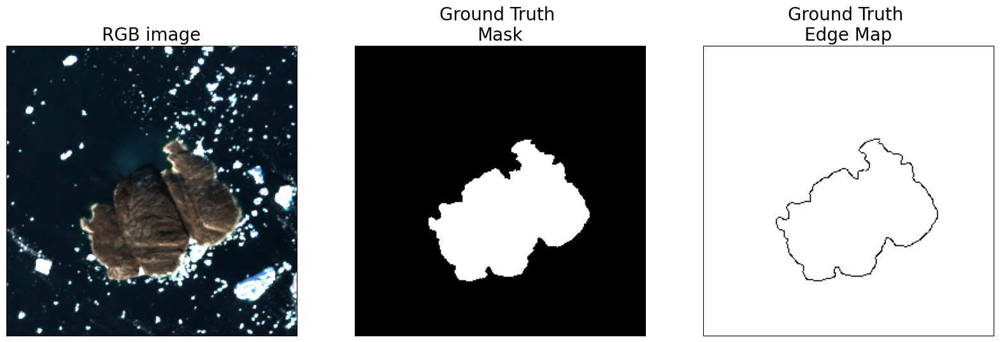

In [5]:
# Sense check edge references
rint = np.random.randint(0,len(edge_reference))
print(rint)
fig, ax = plt.subplots(1,3, figsize=(20,20))
fig.set_facecolor('white')

ax[0].imshow(rgb[rint])
ax[0].set_title('RGB image',size=20)
ax[1].imshow(1-labels[rint] ,  cmap='gray')
ax[1].set_title('Ground Truth \nMask',size=20)
ax[2].imshow(255-edge_reference[rint], cmap='gray')
ax[2].set_title('Ground Truth \nEdge Map',size=20)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

print(np.min(edge_reference[rint]) ,np.max(edge_reference[rint]))

plt.savefig(save_path + '\\Figures\\dataset_example.png', dpi=300, bbox_inches='tight')

## Apply canny edge detection and evaluation metrics

In [6]:
# Apply canny edge detection with different intensity thresholds
def get_canny(input):
        canny_input = input.copy()
        canny = {}

        for threshold in thresholds:
                t1 = threshold[0]
                t2 = threshold[1]
                canny[str(threshold)] = [processor.canny_ed(img,threshold1=t1,threshold2=t2) for img in canny_input]

                print(threshold, len(canny[str(threshold)]),'done')

        return canny

canny = get_canny(input)

[50, 100] 98 done
[50, 150] 98 done
[100, 200] 98 done
[100, 300] 98 done
[200, 400] 98 done
[200, 600] 98 done


In [7]:
# Evaluate canny edge detection with rmse, psnr, uqi, ssim and fom and confusion matrix measures
rows = []

for threshold in thresholds:
    canny_output = canny[str(threshold)]

    for i, output in enumerate(canny_output):
        ref_img = edge_reference[i]
        #ID = "IMG#{}".format(i)
        ID = i
        for j in range(len(channels)):
                
            img = output[:,:,j]

            # Evaluation metrics
            rmse_ = rmse(ref_img,img)
            psnr_ = psnr(ref_img,img)
            uqi_ = uqi(ref_img,img)
            ssim_ = ssim(ref_img,img,multichannel=True)
            fom_ = processor.fom(ref_img,img)
            tp_,fp_,tn_,fn_,tpr_,fpr_,tnr_,fnr_,fp_fn_ratio_ = processor.get_rates(ref_img,img)

            # detect edges as a percentage of reference edges
            pde_ = np.count_nonzero(img)/np.count_nonzero(ref_img)
            
            row = [ID,tuple(threshold),j+ 1,rmse_,psnr_,uqi_,ssim_,fom_,tp_,fp_,tn_,fn_,tpr_,fpr_,tnr_,fnr_,fp_fn_ratio_,pde_]
            rows.append(row)

    print(threshold,'done')
    
df_metrics = pd.DataFrame(rows,columns = ['ID',"thresholds","band","rmse","psnr","uqi","ssim","fom","tp","fp","tn","fn","tpr","fpr","tnr","fnr","fp_fn_ratio","pde"])
df_metrics.to_csv(save_path+"\\canny_evaluation_metrics.csv")
df_metrics.head()

[50, 100] done
[50, 150] done
[100, 200] done
[100, 300] done
[200, 400] done
[200, 600] done


,ID,thresholds,band,rmse,psnr,uqi,ssim,fom,tp,fp,tn,fn,tpr,fpr,tnr,fnr,fp_fn_ratio,pde
0,0,"(50, 100)",1,65.945619,11.747085,0.632636,0.642106,0.468588,219,2172,60934,2211,0.090123,0.034418,0.965582,0.909877,0.982361,0.983951
1,0,"(50, 100)",2,66.701103,11.648143,0.666557,0.676951,0.478589,387,2441,60665,2043,0.159259,0.038681,0.961319,0.840741,1.194812,1.163786
2,0,"(50, 100)",3,67.462835,11.549512,0.670723,0.679588,0.485946,445,2602,60504,1985,0.183128,0.041232,0.958768,0.816872,1.310831,1.253909
3,0,"(50, 100)",4,72.960042,10.869102,0.654382,0.655838,0.498404,730,3665,59441,1700,0.300412,0.058077,0.941923,0.699588,2.155882,1.808642
4,0,"(50, 100)",5,64.937368,11.880910,0.679872,0.685506,0.543737,566,2386,60720,1864,0.232922,0.037809,0.962191,0.767078,1.280043,1.214815


## Analyse metric trend

In [8]:
df_metrics = pd.read_csv(save_path+"\\canny_evaluation_metrics.csv")
df_metrics['fp_fn'] = df_metrics['fp'] + df_metrics['fn']

# Initialise visualisation class
viz = utils.data_visualizer(df_metrics,canny,edge_reference,rgb,thresholds,channels)

In [ ]:
df_metrics.head()

,Unnamed: 0,ID,thresholds,band,rmse,psnr,uqi,ssim,fom,tp,fp,tn,fn,tpr,fpr,tnr,fnr,fp_fn_ratio,pde,fp_fn
0,0,0,"(50, 100)",1,65.945619,11.747085,0.632636,0.642106,0.468588,219,2172,60934,2211,0.090123,0.034418,0.965582,0.909877,0.982361,0.983951,4383
1,1,0,"(50, 100)",2,66.701103,11.648143,0.666557,0.676951,0.478589,387,2441,60665,2043,0.159259,0.038681,0.961319,0.840741,1.194812,1.163786,4484
2,2,0,"(50, 100)",3,67.462835,11.549512,0.670723,0.679588,0.485946,445,2602,60504,1985,0.183128,0.041232,0.958768,0.816872,1.310831,1.253909,4587
3,3,0,"(50, 100)",4,72.960042,10.869102,0.654382,0.655838,0.498404,730,3665,59441,1700,0.300412,0.058077,0.941923,0.699588,2.155882,1.808642,5365
4,4,0,"(50, 100)",5,64.937368,11.880910,0.679872,0.685506,0.543737,566,2386,60720,1864,0.232922,0.037809,0.962191,0.767078,1.280043,1.214815,4250


In [10]:
#Update visualisation class 
# The following test images are removed due to labelling errors: 18, 41, 66
df_metrics_2 = df_metrics.copy()
df_metrics_2 = df_metrics_2.drop(df_metrics_2[df_metrics_2['ID'] == 18].index)
df_metrics_2 = df_metrics_2.drop(df_metrics_2[df_metrics_2['ID'] == 41].index)
df_metrics_2 = df_metrics_2.drop(df_metrics_2[df_metrics_2['ID'] == 66].index)

df_metrics_2['fp_fn'] = df_metrics_2['fp'] + df_metrics_2['fn']


test_paths_2 = test_path.copy()
path1 = test_paths_2.pop(18)
path2 = test_paths_2.pop(41-1)
path3 = test_paths_2.pop(66-2)
print(path1)
print(path2)
print(path3)

input_2, rgb_2, labels_2, edge_reference_2 = get_input(test_paths_2)

canny_2 = get_canny(input_2)

viz_2 = utils.data_visualizer(df_metrics_2,canny_2,edge_reference_2,rgb_2,thresholds,channels)


E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190725T072621_N0213_R049_T37MER_20190725T114710_image_0_0.tif
E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191003T022551_N0213_R046_T49MGM_20191003T062924_image_0_3.tif
E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191226T071311_N0213_R106_T39RWH_20191226T094655_image_0_1.tif
[50, 100] 95 done
[50, 150] 95 done
[100, 200] 95 done
[100, 300] 95 done
[200, 400] 95 done
[200, 600] 95 done


In [11]:
print("fp_fn" in df_metrics_2.columns)
print(df_metrics_2[["fp", "fn", "fp_fn"]].head())


True
     fp    fn  fp_fn
0  2172  2211   4383
1  2441  2043   4484
2  2602  1985   4587
3  3665  1700   5365
4  2386  1864   4250


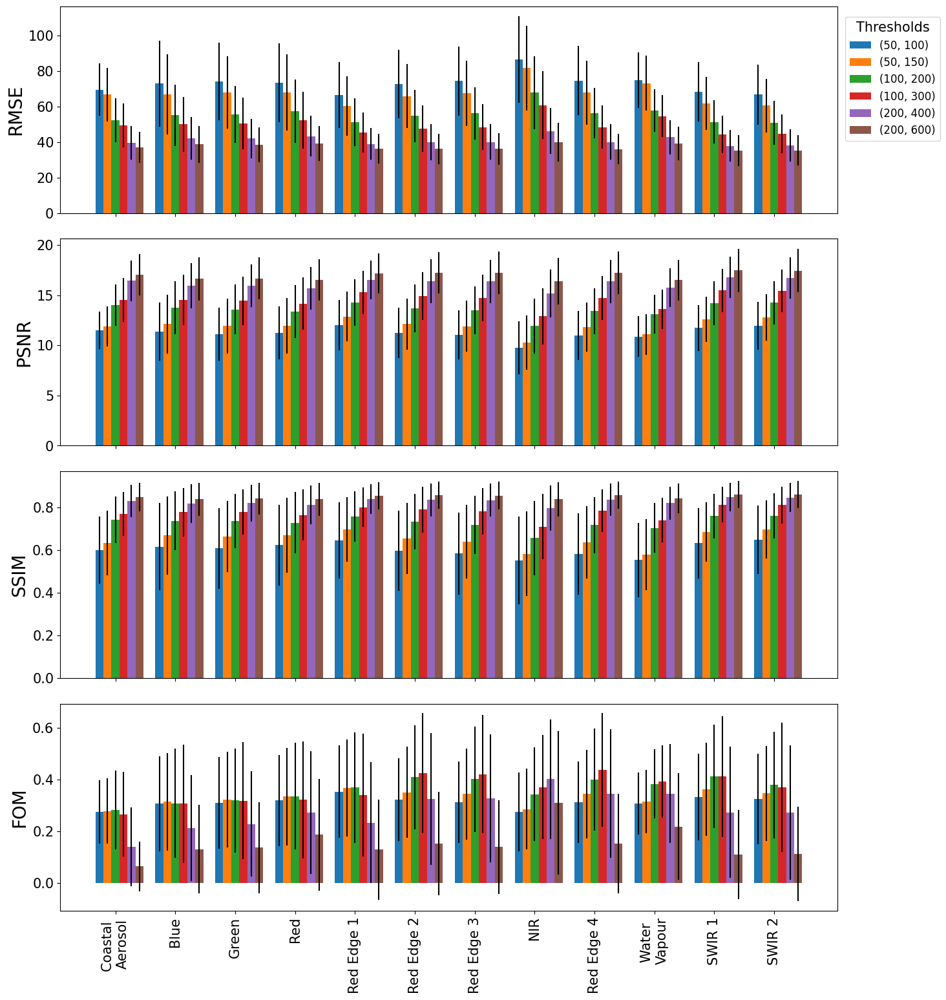

In [12]:
viz_2.plot_combined_metric_trends(['rmse','psnr','ssim','fom'],save_path=save_path+"\\Figures\\all_metrics.png")

In [13]:
# NIR table 
df_metrics_nir = df_metrics_2[df_metrics_2['band']==7]

df_mean = df_metrics_nir[['thresholds', 'rmse','psnr','ssim','fom']].groupby('thresholds').mean().reset_index()
df_mean['threshold 1'] = df_mean['thresholds'].apply(lambda x: int(x.split(',')[0][1:]))
df_mean['threshold 2'] = df_mean['thresholds'].apply(lambda x: int(x.split(',')[1][:-1]))

df_mean = df_mean.sort_values(by=['threshold 1','threshold 2'])[['threshold 1','threshold 2','rmse','psnr','ssim','fom']]
df_mean.columns = ['Threshold 1','Threshold 2','RMSE','PSNR','SSIM','FOM']
df_mean = df_mean.round(2)

df_mean.to_clipboard(index=False)

df_mean.head()

,Threshold 1,Threshold 2,RMSE,PSNR,SSIM,FOM
4,50,100,74.24,11.04,0.58,0.31
5,50,150,67.33,11.91,0.64,0.34
0,100,200,56.04,13.47,0.72,0.40
1,100,300,48.39,14.73,0.78,0.42
2,200,400,39.93,16.37,0.83,0.33


In [14]:
# counts of best thresholds
best_threshold_count = pd.DataFrame(thresholds,columns=['threshold1','threshold2'])

for metric in ['rmse','psnr','ssim','fom']:

    df = df_metrics_2[['ID','thresholds',metric]]

    if metric == 'rmse':
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmin()]
    else:
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmax()]
    count = []
    print(f"\nBest thresholds for {metric}:")
    print(best_thresholds.head())  # Debugging
    for threshold in thresholds:
        df = best_thresholds[best_thresholds['thresholds'].astype(str) == str(tuple(threshold))]
        count.append(len(df))
        # Debugging: Print how many times each threshold appears
        print(f"Threshold {threshold}: {len(df)} occurrences")

    best_threshold_count[metric] = count

best_threshold_count.columns = ['Threshold 1','Threshold 2','RMSE','PSNR','SSIM','FOM']

best_threshold_count.to_clipboard(index=False)
best_threshold_count


Best thresholds for rmse:
      ID  thresholds       rmse
5890   0  (200, 600)  49.102471
5896   1  (200, 600)  33.439685
5912   2  (200, 600)  35.343787
5920   3  (200, 600)  34.706399
5936   4  (200, 600)  49.804688
Threshold [50, 100]: 0 occurrences
Threshold [50, 150]: 0 occurrences
Threshold [100, 200]: 2 occurrences
Threshold [100, 300]: 1 occurrences
Threshold [200, 400]: 3 occurrences
Threshold [200, 600]: 89 occurrences

Best thresholds for psnr:
      ID  thresholds       psnr
5890   0  (200, 600)  14.308737
5896   1  (200, 600)  17.645560
5912   2  (200, 600)  17.164542
5920   3  (200, 600)  17.322612
5936   4  (200, 600)  14.185399
Threshold [50, 100]: 0 occurrences
Threshold [50, 150]: 0 occurrences
Threshold [100, 200]: 2 occurrences
Threshold [100, 300]: 1 occurrences
Threshold [200, 400]: 3 occurrences
Threshold [200, 600]: 89 occurrences

Best thresholds for ssim:
      ID  thresholds      ssim
5887   0  (200, 600)  0.761499
5896   1  (200, 600)  0.871444
5912   2  (2

,Threshold 1,Threshold 2,RMSE,PSNR,SSIM,FOM
0,50,100,0,0,1,2
1,50,150,0,0,1,6
2,100,200,2,2,1,12
3,100,300,1,1,7,30
4,200,400,3,3,20,30
5,200,600,89,89,65,15


## Visual analysis of best thresholds

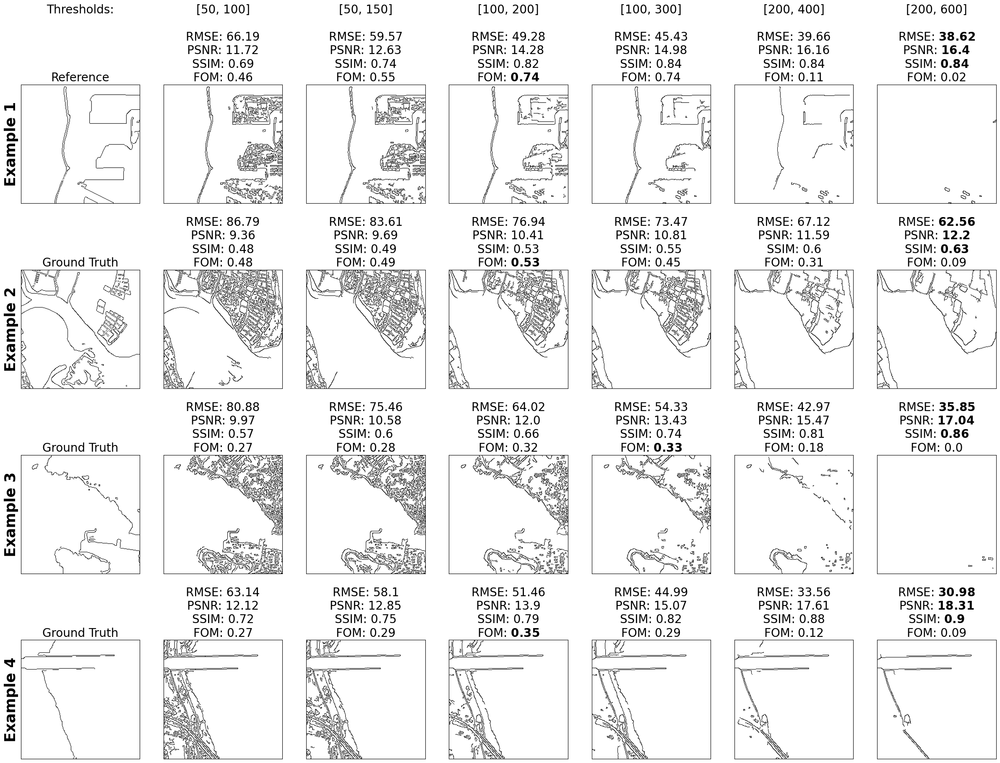

In [26]:
# Examples of results where FOM identifies the best threshold
import ast

# Convert thresholds to tuples if they are stored as strings
df_metrics_2["thresholds"] = df_metrics_2["thresholds"].apply(lambda x: tuple(ast.literal_eval(x)) if isinstance(x, str) else x)

IDs = [74,40,2,68]
viz.example_plots(IDs,save_path=save_path+"\\Figures\\good_examples.png")

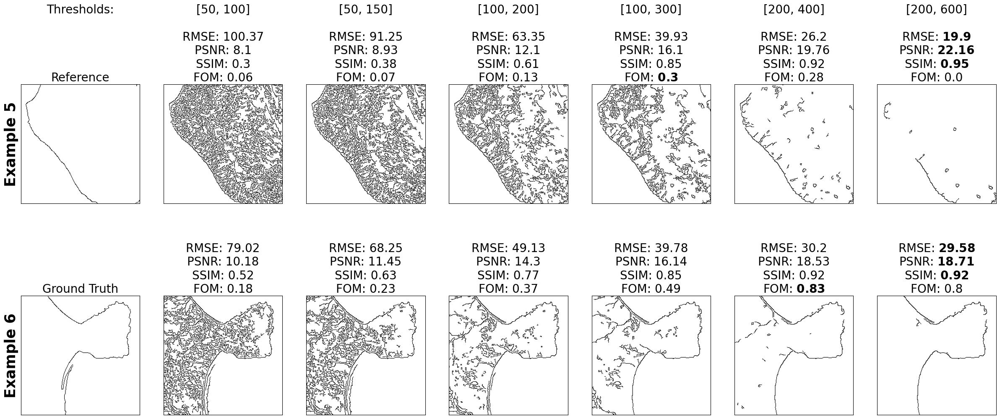

In [ ]:
# Examples of results where FOM does not identify the best threshold
IDs = [15,32]
viz.example_plots(IDs,ex_diff=4,save_path=save_path+"\\Figures\\bad_examples.png")

# Figure for abstract

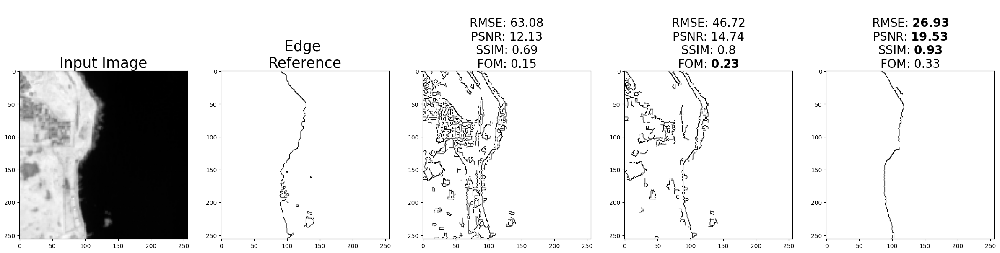

In [ ]:
import importlib
importlib.reload(utils)  # Ensure latest version of utils is used

fig, axs = plt.subplots(1, 5, figsize=(30, 20))
fig.set_facecolor('white')

rint = 67  # Select image index

thresholds = [[50,100],[100,200],[200,400]]
band = 10 

img_input = input[rint].copy()

axs[0].imshow(img_input[:,:,band], cmap="gray")
axs[0].set_title("Input Image", size=25)

ref_img = edge_reference[rint]
axs[1].imshow(255 - ref_img, cmap="gray")
axs[1].set_title("Edge \nReference", size=25)

# Ensure we use the processor instance to call canny_ed
processor = utils.data_processor()  

for i, threshold in enumerate(thresholds):
    t1, t2 = threshold
    canny = processor.canny_ed(img_input, threshold1=t1, threshold2=t2)  # Call with processor instance
    img = canny[:,:,band]
    
    axs[i+2].imshow(255 - img, cmap="gray")
    
    rmse_ = round(rmse(ref_img, img), 2)
    psnr_ = round(psnr(ref_img, img), 2)
    ssim_ = round(ssim(ref_img, img, multichannel=True), 2)
    fom_ = round(processor.fom(ref_img, img), 2)

    if i == 0:
        axs[i+2].set_title("\nRMSE: {}\nPSNR: {}\nSSIM: {}\nFOM: {}".format(rmse_, psnr_, ssim_, fom_), size=20)
    elif i == 1:
        axs[i+2].set_title("\nRMSE: {}\nPSNR: {}\nSSIM: {}\nFOM: ".format(rmse_, psnr_, ssim_) + r"$\bf{" + str(fom_) + "}$", size=20)
    else:
        axs[i+2].set_title("\nRMSE: " + r"$\bf{" + str(rmse_) + "}$" + 
                           "\nPSNR: " + r"$\bf{" + str(psnr_) + "}$" +
                           "\nSSIM: " + r"$\bf{" + str(ssim_) + "}$" +
                           "\nFOM: " + str(fom_), size=20)

plt.show()


# Visual analysis

In [21]:
#Get image names for visual analysis
x = [path.split("/")[-1] for path in test_path]
df = pd.DataFrame({"ID":x})
df.to_clipboard(index=False)

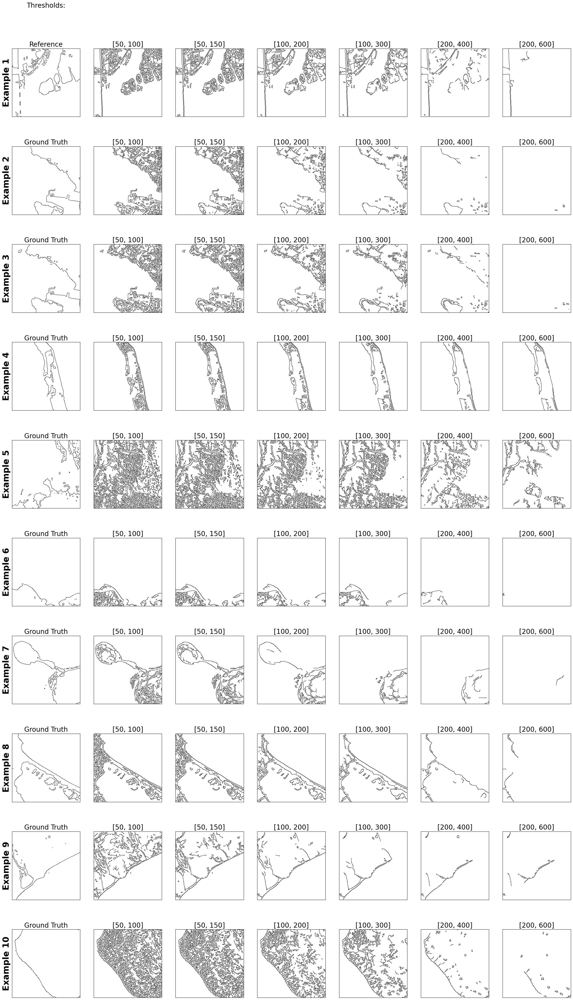

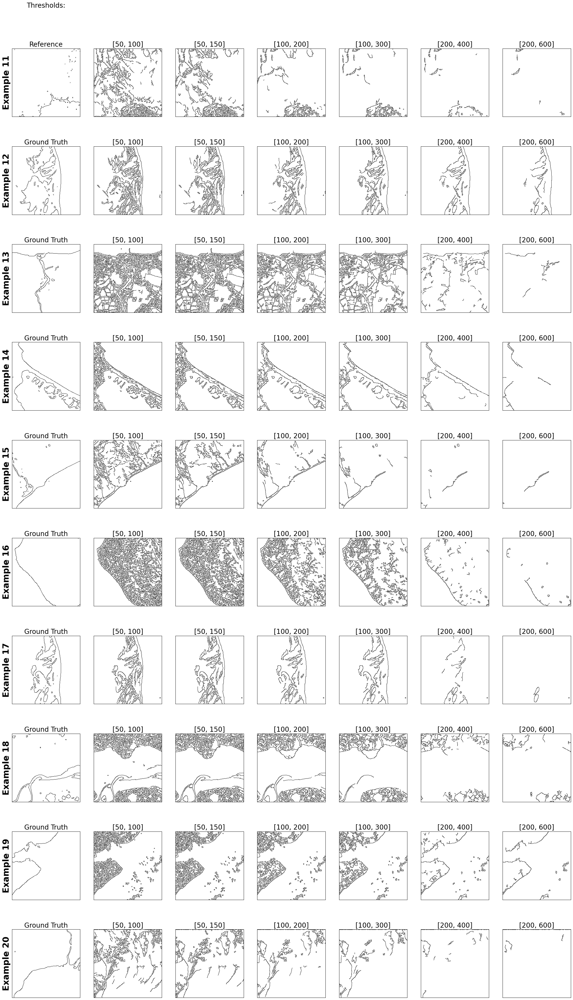

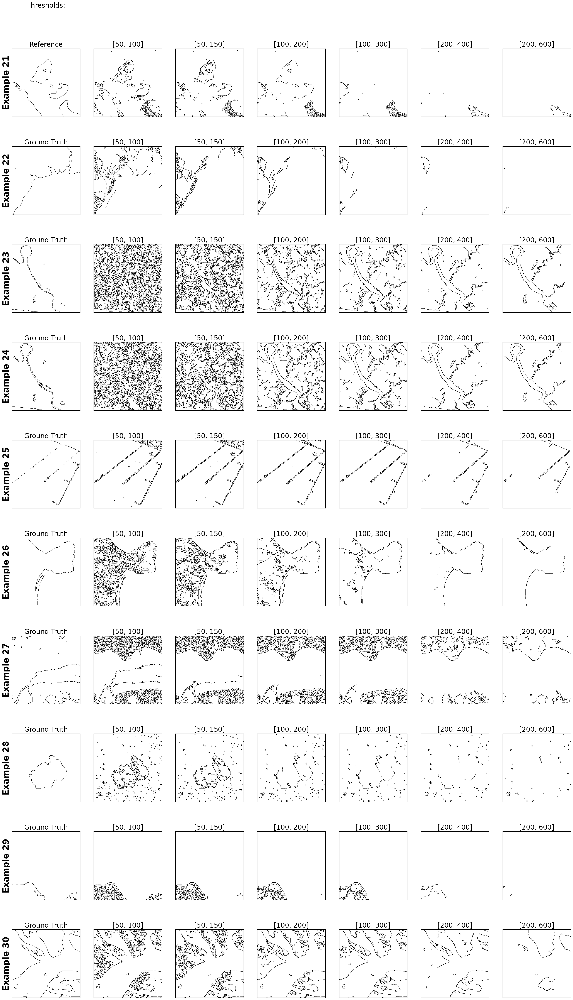

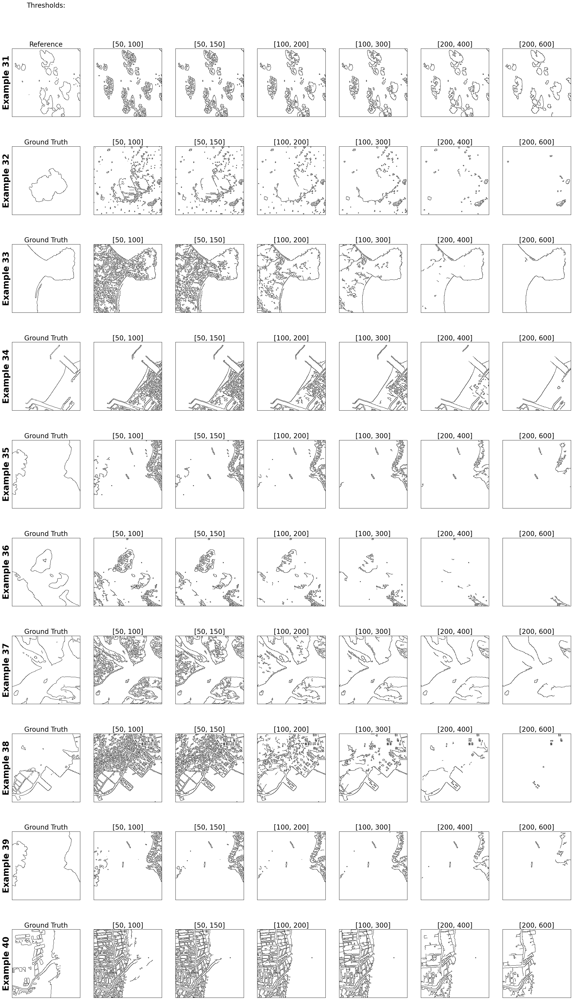

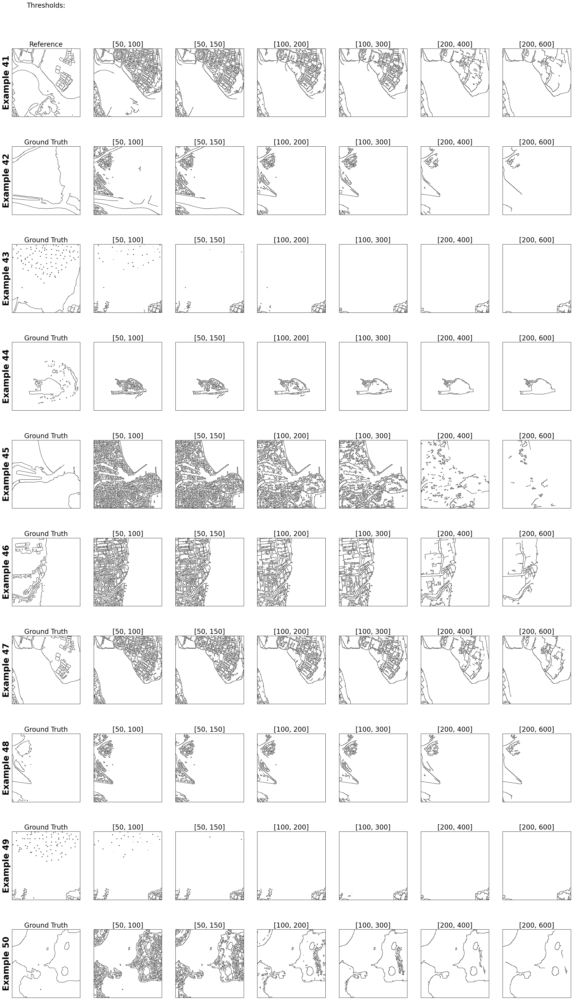

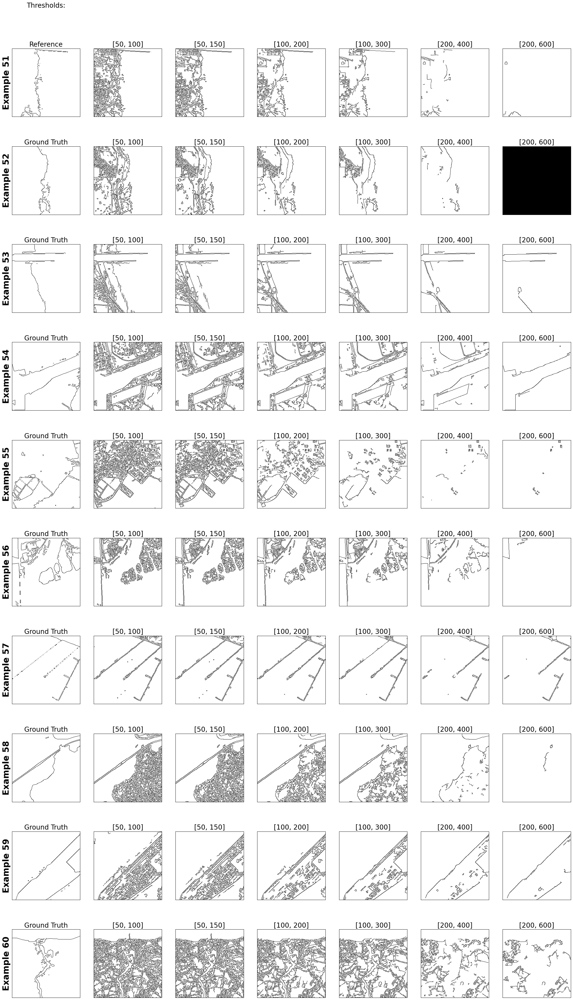

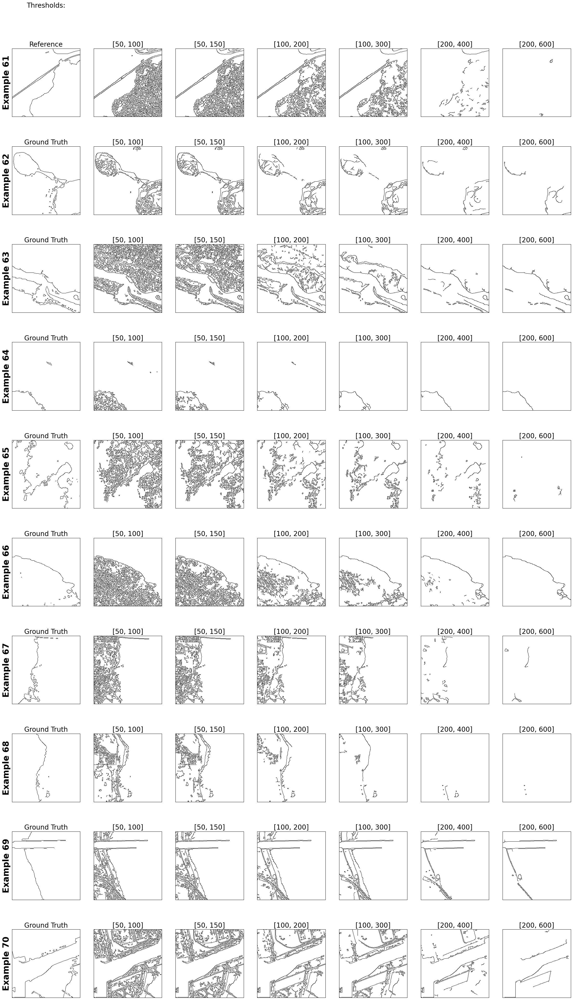

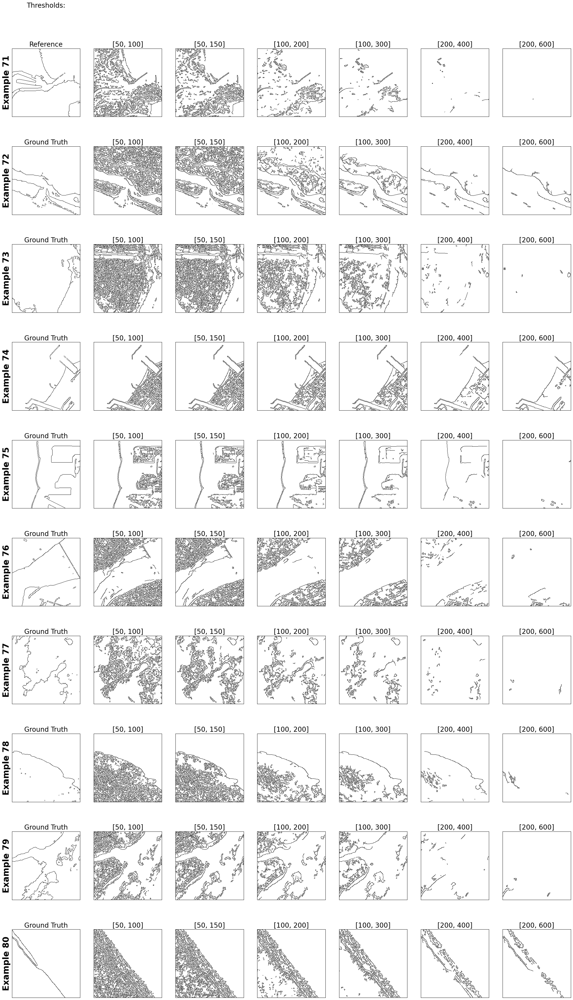

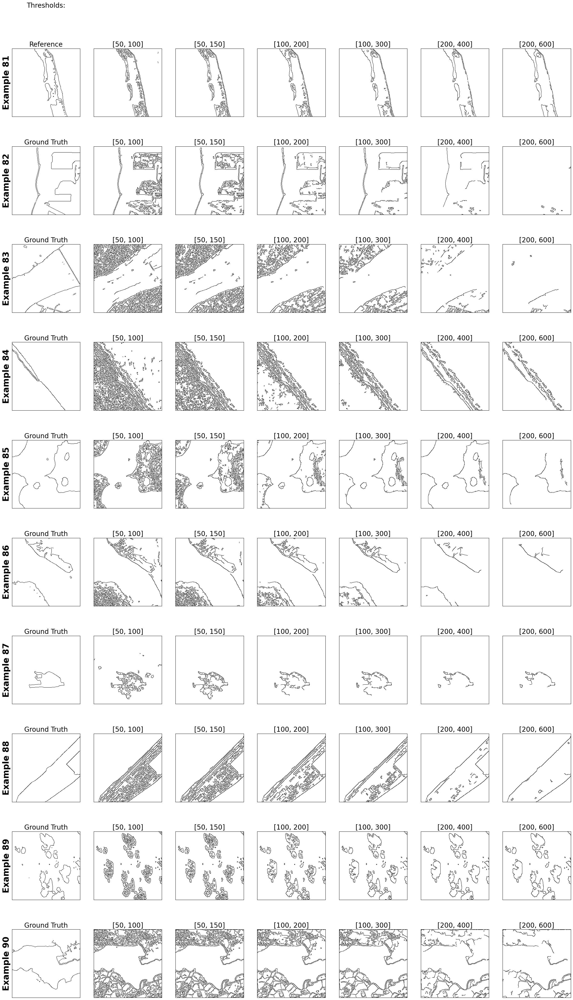

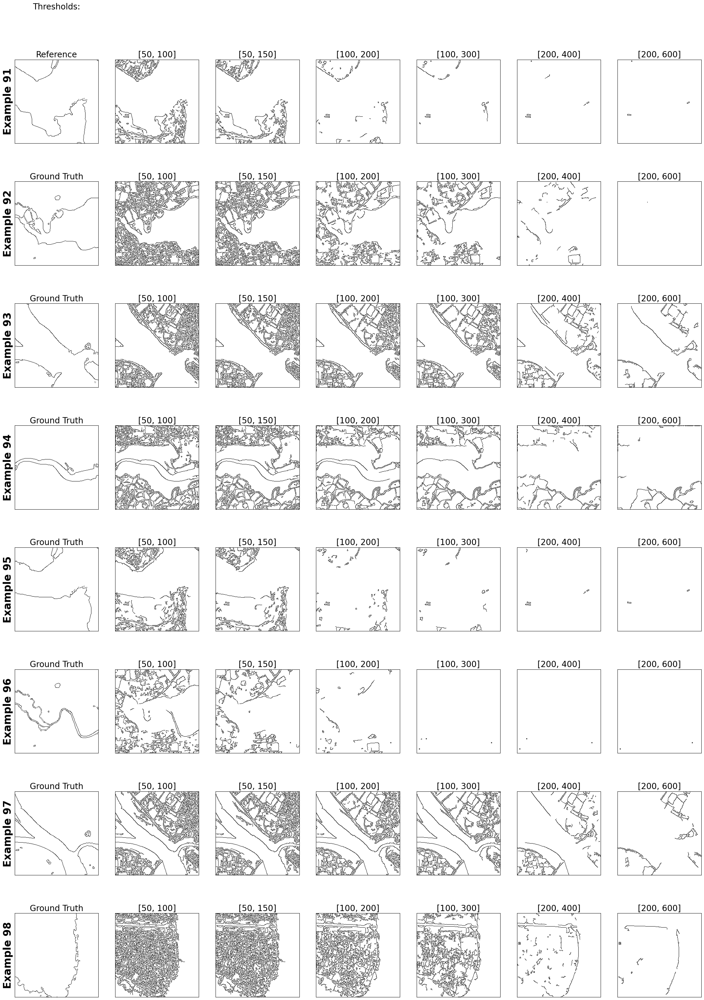

In [22]:
# Visual inspection to choose the best band
# Exclude images 18+1, 41+1, 66+1 from final analysis
ALL_IDS = [range(0,10),range(10,20),range(20,30),range(30,40),range(40,50),range(50,60),range(60,70),range(70,80),range(80,90),range(90,98)]

for i,IDs in enumerate(ALL_IDS):
    viz.example_plots(IDs,ex_diff=10*i,show_metrics=False)